# Tomato Leaf Disease Detection

## 1) Setup

In [ ]:
# If running on Colab, install deps and enable GPU in Runtime > Change runtime type
!pip -q install tensorflow==2.15.0 pillow scikit-learn matplotlib opencv-python pandas
import tensorflow as tf, matplotlib, numpy as np
print("TF:", tf.__version__, "| Matplotlib:", matplotlib.__version__)
!nvidia-smi || echo "No GPU detected (OK but slower)"


ERROR: Could not find a version that satisfies the requirement tensorflow==2.15.0 (from versions: 2.16.0rc0, 2.16.1, 2.16.2, 2.17.0rc0, 2.17.0rc1, 2.17.0, 2.17.1, 2.18.0rc0, 2.18.0rc1, 2.18.0rc2, 2.18.0, 2.18.1, 2.19.0rc0, 2.19.0, 2.19.1, 2.20.0rc0, 2.20.0)
ERROR: No matching distribution found for tensorflow==2.15.0
TF: 2.19.0 | Matplotlib: 3.10.0
Sun Nov 23 14:22:42 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+======================

## 2) Mount Google Drive & Configure Paths

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# ⚠️ TODO: Change this to your dataset location in Drive (10 class folders)
RAW_DATA_DIR = "/content/drive/MyDrive/Dataset/TomatoDataset"

PROCESSED_DIR = "/content/processed_tomato_224"
IMG_W, IMG_H = 224, 224
SEED = 42
TEST_SPLIT = 0.15
VAL_SPLIT = 0.15
BATCH_SIZE = 32


Mounted at /content/drive


## 3) Imports

In [ ]:
import os, math, shutil, random, glob, itertools, json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance, ImageFilter
import cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_fscore_support
from sklearn.preprocessing import label_binarize

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)


## 4) EDA: List classes, counts, and sample images

Detected classes: 10
 - Tomato___Bacterial_spot
 - Tomato___Early_blight
 - Tomato___Late_blight
 - Tomato___Leaf_Mold
 - Tomato___Septoria_leaf_spot
 - Tomato___Spider_mites Two-spotted_spider_mite
 - Tomato___Target_Spot
 - Tomato___Tomato_Yellow_Leaf_Curl_Virus
 - Tomato___Tomato_mosaic_virus
 - Tomato___healthy


,class,count
3,Tomato___Leaf_Mold,400
1,Tomato___Early_blight,298
9,Tomato___healthy,157
5,Tomato___Spider_mites Two-spotted_spider_mite,121
2,Tomato___Late_blight,111
8,Tomato___Tomato_mosaic_virus,109
0,Tomato___Bacterial_spot,108
4,Tomato___Septoria_leaf_spot,106
7,Tomato___Tomato_Yellow_Leaf_Curl_Virus,100
6,Tomato___Target_Spot,99


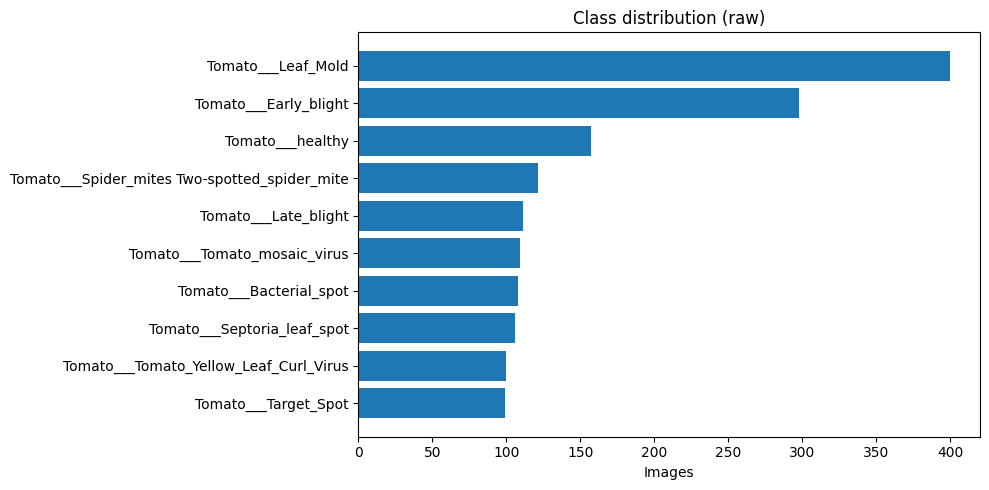

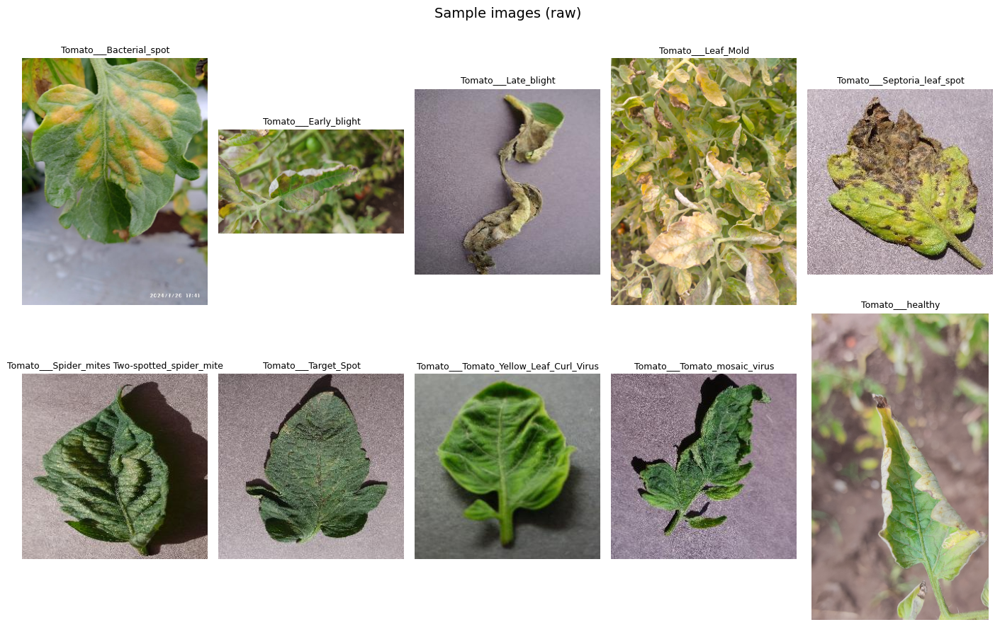

In [ ]:
raw_dir = Path(RAW_DATA_DIR)
assert raw_dir.exists(), f"RAW_DATA_DIR not found: {RAW_DATA_DIR}"

class_dirs = sorted([p.name for p in raw_dir.iterdir() if p.is_dir()])
print("Detected classes:", len(class_dirs))
for c in class_dirs: print(" -", c)

rows = []
for c in class_dirs:
    rows.append((c, len(list((raw_dir/c).glob("*.*")))))
eda_df = pd.DataFrame(rows, columns=["class", "count"]).sort_values("count", ascending=False)
display(eda_df)

plt.figure(figsize=(10,5))
plt.barh(eda_df["class"], eda_df["count"])
plt.title("Class distribution (raw)"); plt.xlabel("Images"); plt.gca().invert_yaxis(); plt.tight_layout(); plt.show()

n_show = min(10, len(class_dirs))
plt.figure(figsize=(14,9))
for i, cls in enumerate(class_dirs[:n_show]):
    imgs = list((raw_dir/cls).glob("*.*"))
    if not imgs: continue
    img = Image.open(random.choice(imgs)).convert("RGB")
    plt.subplot(2, math.ceil(n_show/2), i+1)
    plt.imshow(img); plt.title(cls, fontsize=9); plt.axis("off")
plt.suptitle("Sample images (raw)", fontsize=14); plt.tight_layout(); plt.show()


## 5) Preprocessing: Resize 224×224 and save; Train/Val/Test split

In [ ]:
def clean_dir(d):
    d = Path(d)
    if d.exists(): shutil.rmtree(d)
    d.mkdir(parents=True, exist_ok=True)

clean_dir(PROCESSED_DIR)

all_paths = []
for cls in class_dirs:
    files = sorted([str(p) for p in (raw_dir/cls).glob("*.*")])
    random.shuffle(files)
    n_total = len(files)
    n_test = int(TEST_SPLIT * n_total)
    n_trainval = n_total - n_test
    n_val = int(VAL_SPLIT * n_trainval)
    n_train = n_trainval - n_val
    train_files = files[:n_train]
    val_files = files[n_train:n_train+n_val]
    test_files = files[n_train+n_val:]
    all_paths.append((cls, train_files, val_files, test_files))
    print(f"{cls}: train={len(train_files)}, val={len(val_files)}, test={len(test_files)}")

for split in ["train","val","test"]:
    for cls in class_dirs:
        Path(PROCESSED_DIR, split, cls).mkdir(parents=True, exist_ok=True)

def save_resized(src, dst, size=(224,224)):
    try:
        im = Image.open(src).convert("RGB").resize(size, Image.BILINEAR)
        im.save(dst, quality=95)
    except Exception as e:
        print("Error:", src, e)

for cls, train_files, val_files, test_files in all_paths:
    for s, files in [("train", train_files), ("val", val_files), ("test", test_files)]:
        for src in files:
            dst = Path(PROCESSED_DIR, s, cls, Path(src).name)
            save_resized(src, dst, size=(IMG_W, IMG_H))

print("Resized images saved to:", PROCESSED_DIR)


Tomato___Bacterial_spot: train=79, val=13, test=16
Tomato___Early_blight: train=216, val=38, test=44
Tomato___Late_blight: train=81, val=14, test=16
Tomato___Leaf_Mold: train=289, val=51, test=60
Tomato___Septoria_leaf_spot: train=78, val=13, test=15
Tomato___Spider_mites Two-spotted_spider_mite: train=88, val=15, test=18
Tomato___Target_Spot: train=73, val=12, test=14
Tomato___Tomato_Yellow_Leaf_Curl_Virus: train=73, val=12, test=15
Tomato___Tomato_mosaic_virus: train=80, val=13, test=16
Tomato___healthy: train=114, val=20, test=23
Resized images saved to: /content/processed_tomato_224


## 6) Augmentation (SAVED to disk for **train** split): brightness (0.5, 1.5), rotate (30,45,60,90), noise, blur

✅ Augmented images saved to TRAIN split.


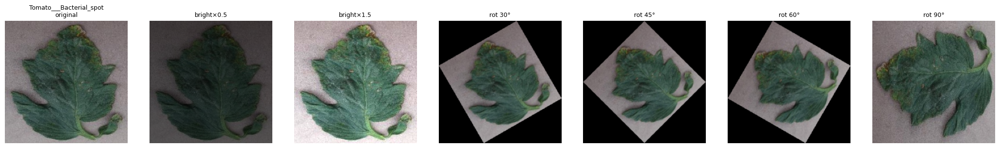

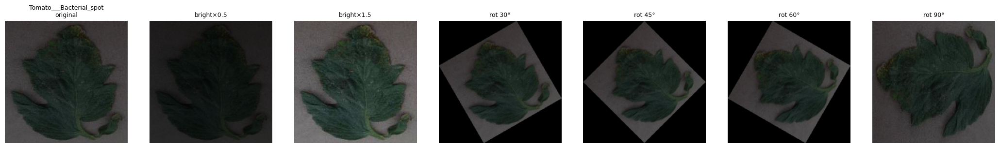

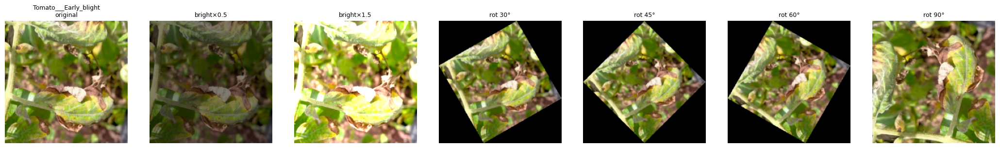

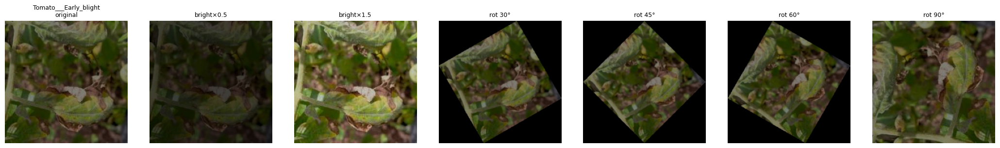

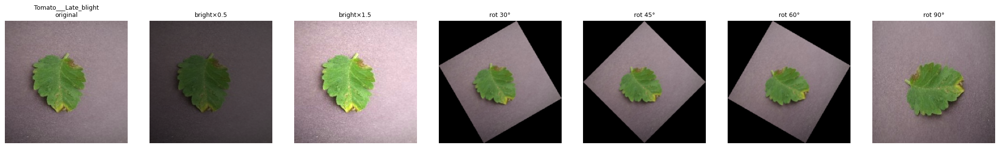

...

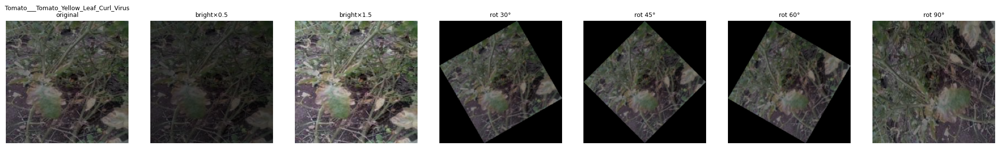

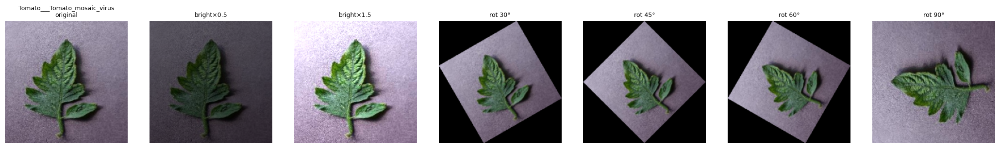

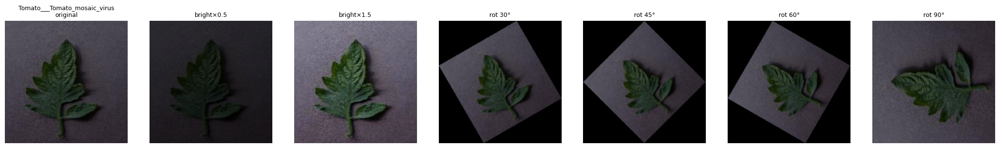

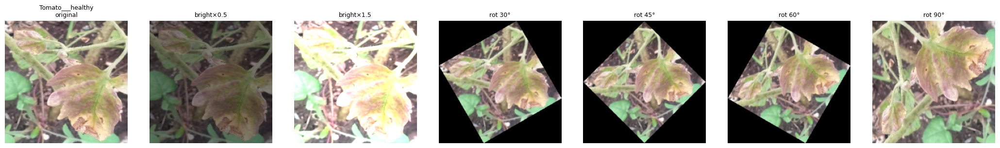

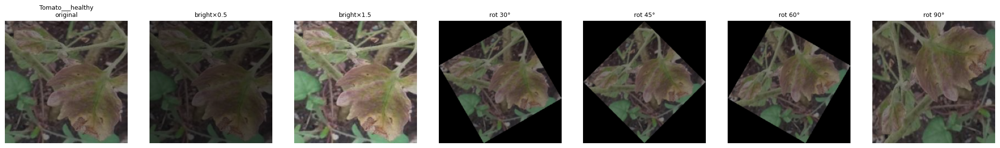

In [ ]:
# ===== Augmentation: SAVE to train split + SHOW example augmented outputs =====
import random
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance, ImageFilter

# ---------- Aug functions (unchanged) ----------
def add_gaussian_noise(pil_img, sigma=12):
    arr = np.array(pil_img).astype(np.float32)
    noise = np.random.normal(0, sigma, arr.shape).astype(np.float32)
    arr = np.clip(arr + noise, 0, 255).astype(np.uint8)
    return Image.fromarray(arr)

def add_gaussian_blur(pil_img, radius=1.5):
    return pil_img.filter(ImageFilter.GaussianBlur(radius=radius))

def change_brightness(pil_img, factor):
    return ImageEnhance.Brightness(pil_img).enhance(factor)

def rotate_exact(pil_img, degrees):
    # rotate and then re-fit to target size
    return pil_img.rotate(degrees, resample=Image.BILINEAR, expand=True).resize((IMG_W, IMG_H), Image.BILINEAR)

# ---------- Config ----------
AUG_ROT      = [30, 45, 60, 90]
AUG_BRIGHT   = [0.5, 1.5]
NOISE_SIGMA  = 12
BLUR_RADIUS  = 1.5

# How many examples to SHOW per class (to avoid flooding the output)
SHOW_EXAMPLES_PER_CLASS = 2  # set to 0 to disable showing
random.seed(SEED)

train_root = Path(PROCESSED_DIR) / "train"

# We'll collect a few examples while we save everything
examples_to_show = []  # list of dicts: { 'class': str, 'original': PIL, 'aug_list': [(title, PIL), ...] }

for cls in class_dirs:
    cls_dir = train_root / cls
    imgs = sorted(cls_dir.glob("*.*"))  # after resize step, these exist
    if not imgs:
        continue

    shown_for_this_class = 0

    for p in imgs:
        try:
            base = Image.open(p).convert("RGB")  # already 224x224 from the previous resize step

            # Prepare augmented images and filenames
            aug_pairs = []  # list of (title, aug_image, save_suffix)
            for f in AUG_BRIGHT:
                aug_pairs.append((f"bright×{f}", change_brightness(base, f), f"_b{str(f).replace('.','')}"))
            for deg in AUG_ROT:
                aug_pairs.append((f"rot {deg}°", rotate_exact(base, deg), f"_r{deg}"))
            aug_pairs.append(("noise", add_gaussian_noise(base, sigma=NOISE_SIGMA), "_noise"))
            aug_pairs.append(("blur",  add_gaussian_blur(base, radius=BLUR_RADIUS), "_blur"))

            # SAVE all augmentations for this image
            for title, aug_img, suffix in aug_pairs:
                aug_img.save(cls_dir / f"{p.stem}{suffix}{p.suffix}")

            # COLLECT a few samples to SHOW (limit per class)
            if shown_for_this_class < SHOW_EXAMPLES_PER_CLASS:
                # Make a copy of original resized (base is already 224x224)
                orig_disp = base.copy()
                # Take a small subset to display (up to 6 to keep grid reasonable)
                display_subset = aug_pairs[:6]
                examples_to_show.append({
                    "class": cls,
                    "original": orig_disp,
                    "aug_list": [(title, img.copy()) for (title, img, _) in display_subset]
                })
                shown_for_this_class += 1

        except Exception as e:
            print("Aug error:", p, e)

print("✅ Augmented images saved to TRAIN split.")

# ---------- SHOW collected examples ----------
if SHOW_EXAMPLES_PER_CLASS > 0 and examples_to_show:
    # Build a grid per example: 1 original + N augmentations (up to 6 shown)
    for ex in examples_to_show:
        cls_name = ex["class"]
        original = ex["original"]
        aug_list = ex["aug_list"]  # list of (title, PIL)

        n_cols = 1 + len(aug_list)
        plt.figure(figsize=(3*n_cols, 3))
        # Original
        plt.subplot(1, n_cols, 1)
        plt.imshow(original)
        plt.title(f"{cls_name}\noriginal", fontsize=9)
        plt.axis("off")

        # Augs
        for i, (title, img) in enumerate(aug_list, start=2):
            plt.subplot(1, n_cols, i)
            plt.imshow(img)
            plt.title(title, fontsize=9)
            plt.axis("off")

        plt.tight_layout()
        plt.show()
else:
    print("No examples displayed (set SHOW_EXAMPLES_PER_CLASS > 0 to preview).")


## 7) Data Pipeline + normalization (0–1)

Found 10539 files belonging to 10 classes.
Found 201 files belonging to 10 classes.
Found 237 files belonging to 10 classes.


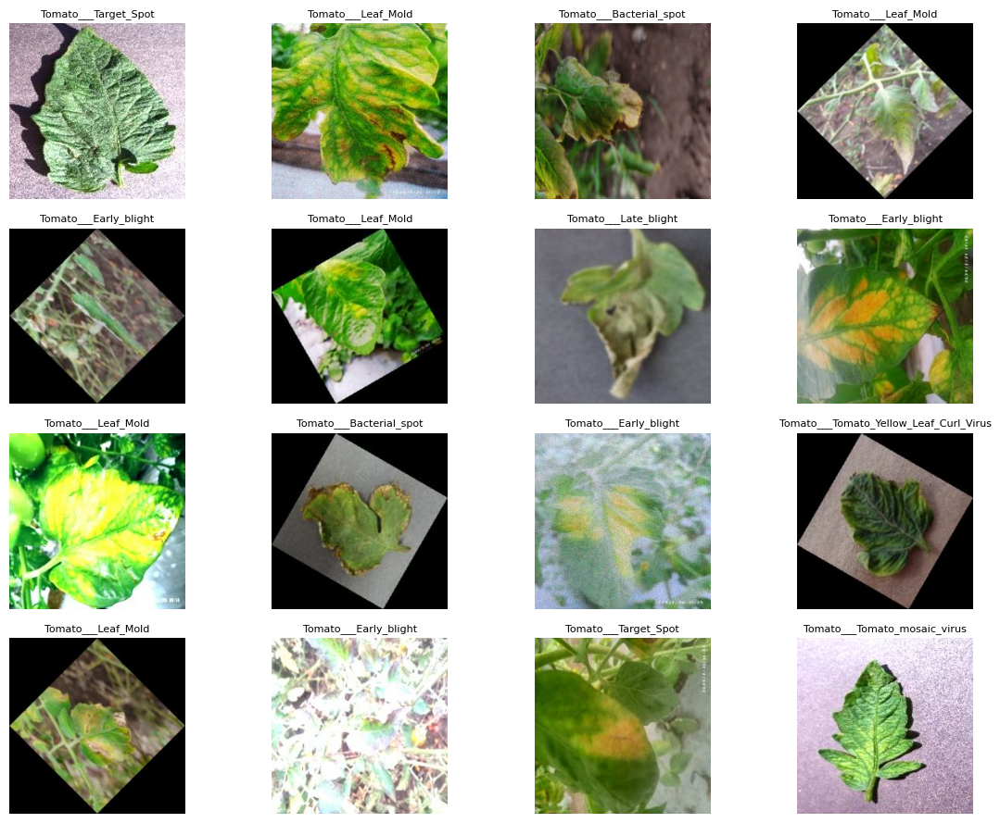

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = (IMG_W, IMG_H)
NUM_CLASSES = len(class_dirs)

def make_ds(split, shuffle=True):
    ds = tf.keras.utils.image_dataset_from_directory(
        directory=str(Path(PROCESSED_DIR, split)),
        labels='inferred',
        label_mode='categorical',
        class_names=class_dirs,
        image_size=IMG_SIZE,
        batch_size=32,
        shuffle=shuffle,
        seed=SEED
    )
    ds = ds.map(lambda x,y: (tf.cast(x, tf.float32)/255.0, y), num_parallel_calls=AUTOTUNE)
    return ds.prefetch(AUTOTUNE)

train_ds = make_ds("train", True)
val_ds   = make_ds("val", False)
test_ds  = make_ds("test", False)

images, labels = next(iter(train_ds))
plt.figure(figsize=(12,9))
for i in range(min(16, len(images))):
    plt.subplot(4,4,i+1)
    plt.imshow(images[i].numpy())
    plt.title(class_dirs[int(tf.argmax(labels[i]).numpy())], fontsize=8)
    plt.axis("off")
plt.tight_layout(); plt.show()


## 8) Models: **ResNet50**, MobileNetV2, EfficientNetB0 (transfer learning)

In [ ]:
def make_transfer(model_fn, input_shape=(224,224,3), num_classes=NUM_CLASSES, train_base=False):
    base = model_fn(include_top=False, input_shape=input_shape, weights='imagenet')
    base.trainable = train_base
    inputs = keras.Input(shape=input_shape)
    x = base(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    model = keras.Model(inputs, outputs, name=base.name+"_clf")
    model.compile(optimizer=keras.optimizers.Adam(1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

resnet50  = make_transfer(tf.keras.applications.ResNet50)        # ⬅ replaces Custom CNN
mobilenet = make_transfer(tf.keras.applications.MobileNetV2)
efficient = make_transfer(tf.keras.applications.EfficientNetB0)

models_to_train = [
    ("ResNet50", resnet50, 1),
    ("MobileNetV2", mobilenet, 20),
    ("EfficientNetB0", efficient, 1),
]


## 9) Train the three models


===== Training ResNet50 =====
Found 10539 files belonging to 10 classes.
Found 201 files belonging to 10 classes.
Epoch 1/20
659/659 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - accuracy: 0.8777 - loss: 0.3188 - val_accuracy: 0.7960 - val_loss: 0.6167 - learning_rate: 6.2500e-05
Epoch 2/20
659/659 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - accuracy: 0.8794 - loss: 0.3164 - val_accuracy: 0.7960 - val_loss: 0.6245 - learning_rate: 6.2500e-05
Epoch 3/20
658/659 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.8882 - loss: 0.3048
Epoch 3: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
659/659 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - accuracy: 0.8882 - loss: 0.3048 - val_accuracy: 0.7960 - val_loss: 0.6184 - learning_rate: 6.2500e-05
Epoch 4/20
659/659 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - accuracy: 0.8842 - loss: 0.3019 - val_accuracy: 0.7910 - val_loss: 0.6178 - learning_rate: 3.1250e-05
Epoch 5/20
658/659 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.8857 - loss: 0.3046
Epoch 5: Reduc

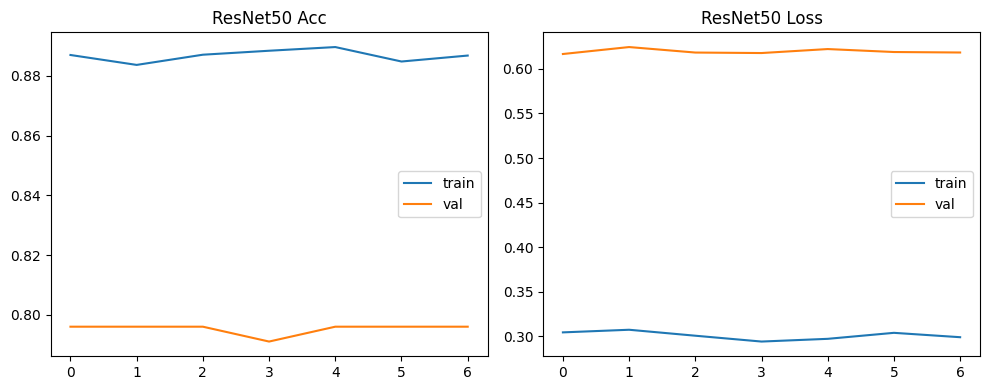

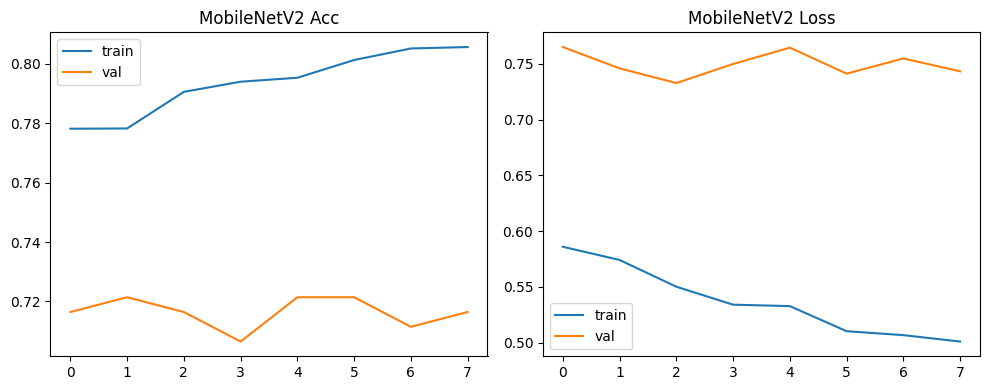

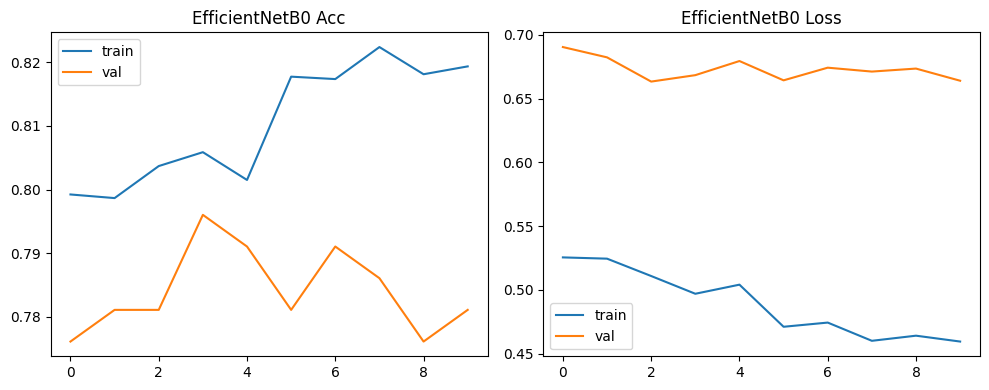

In [ ]:
# ========= IMPROVED TRAINING LOOP (per-backbone preprocess + better callbacks) =========
# Drop-in replacement for your current training loop block.

from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as efficient_preprocess

AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = (IMG_W, IMG_H)

def make_ds_with_preprocess(split, preprocess_fn, batch_size=32, shuffle=True):
    """Build a dataset for a given split using the correct preprocess_input for the backbone."""
    ds = tf.keras.utils.image_dataset_from_directory(
        directory=str(Path(PROCESSED_DIR, split)),
        labels='inferred',
        label_mode='categorical',     # <-- fixed spelling
        class_names=class_dirs,
        image_size=IMG_SIZE,
        batch_size=batch_size,
        shuffle=shuffle,
        seed=SEED
    )
    def _prep(x, y):
        x = tf.cast(x, tf.float32)
        x = preprocess_fn(x)          # IMPORTANT: backbone-specific preprocessing
        return x, y
    return ds.map(_prep, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

# Configure per-model training params
per_model_cfg = {
    "ResNet50": {
        "model": resnet50,                 # already defined via make_transfer(...)
        "preprocess": resnet_preprocess,
        "epochs": 20,                      # feel free to adjust
        "batch_size": 16                   # smaller batch often helps
    },
    "MobileNetV2": {
        "model": mobilenet,
        "preprocess": mobilenet_preprocess,
        "epochs": 20,
        "batch_size": 16
    },
    "EfficientNetB0": {
        "model": efficient,
        "preprocess": efficient_preprocess,
        "epochs": 20,
        "batch_size": 16
    },
}

history_dict = {}
best_models = {}

def train_one(name, cfg):
    print(f"\n===== Training {name} =====")
    model = cfg["model"]
    bs = cfg["batch_size"]
    preprocess_fn = cfg["preprocess"]
    epochs = cfg["epochs"]

    # Build datasets with the proper preprocess function
    tr_ds = make_ds_with_preprocess("train", preprocess_fn, batch_size=bs, shuffle=True)
    va_ds = make_ds_with_preprocess("val",   preprocess_fn, batch_size=bs, shuffle=False)

    # Smarter callbacks: longer patience + LR reduction when val_loss stalls
    cbs = [
        keras.callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_accuracy"),
        keras.callbacks.ModelCheckpoint(f"{name}_best.keras", save_best_only=True, monitor="val_accuracy"),
        keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1)
    ]

    hist = model.fit(tr_ds, validation_data=va_ds, epochs=epochs, callbacks=cbs, verbose=1)
    history_dict[name] = hist.history
    best_models[name] = keras.models.load_model(f"{name}_best.keras")

    # OPTIONAL: fine-tune MobileNetV2 tail to keep improving after the head converges
    if name == "MobileNetV2":
        print("\n-- Fine-tuning MobileNetV2 tail (last ~40 layers) with tiny LR --")
        mob = best_models["MobileNetV2"]

        # Find the MobileNetV2 base inside the classifier
        base = None
        for layer in mob.layers:
            if isinstance(layer, tf.keras.Model) and "MobileNetV2" in layer.name:
                base = layer
                break

        if base is not None:
            unfroze = 0
            for lyr in base.layers[-40:]:
                if not isinstance(lyr, tf.keras.layers.BatchNormalization):
                    lyr.trainable = True
                    unfroze += 1
            print(f"Unfroze {unfroze} layers.")

            mob.compile(optimizer=keras.optimizers.Adam(1e-5),
                        loss="categorical_crossentropy",
                        metrics=["accuracy"])

            ft_cbs = [
                keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True, monitor="val_accuracy"),
                keras.callbacks.ModelCheckpoint("MobileNetV2_finetuned.keras", save_best_only=True, monitor="val_accuracy"),
                keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1),
            ]
            mob.fit(tr_ds, validation_data=va_ds, epochs=12, callbacks=ft_cbs, verbose=1)
            best_models["MobileNetV2"] = tf.keras.models.load_model("MobileNetV2_finetuned.keras")

    return history_dict[name]

# Train each model you want
for name in ["ResNet50", "MobileNetV2", "EfficientNetB0"]:
    if name in per_model_cfg:
        train_one(name, per_model_cfg[name])

# Plot training curves
def plot_history(h, title):
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.plot(h.get('accuracy', []), label='train')
    plt.plot(h.get('val_accuracy', []), label='val')
    plt.title(f'{title} Acc'); plt.legend()
    plt.subplot(1,2,2)
    plt.plot(h.get('loss', []), label='train')
    plt.plot(h.get('val_loss', []), label='val')
    plt.title(f'{title} Loss'); plt.legend()
    plt.tight_layout(); plt.show()

for name, h in history_dict.items():
    plot_history(h, name)
# ========= END IMPROVED TRAINING LOOP =========


## 10) Evaluation: Precision, Recall, F1, Confusion Matrix, ROC


===== Evaluation: ResNet50 =====

Classification report:
                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot     0.0000    0.0000    0.0000        16
                        Tomato___Early_blight     0.0000    0.0000    0.0000        44
                         Tomato___Late_blight     0.0675    1.0000    0.1265        16
                           Tomato___Leaf_Mold     0.0000    0.0000    0.0000        60
                  Tomato___Septoria_leaf_spot     0.0000    0.0000    0.0000        15
Tomato___Spider_mites Two-spotted_spider_mite     0.0000    0.0000    0.0000        18
                         Tomato___Target_Spot     0.0000    0.0000    0.0000        14
       Tomato___Tomato_Yellow_Leaf_Curl_Virus     0.0000    0.0000    0.0000        15
                 Tomato___Tomato_mosaic_virus     0.0000    0.0000    0.0000        16
                             Tomato___healthy     0.0000    0.0000    0

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


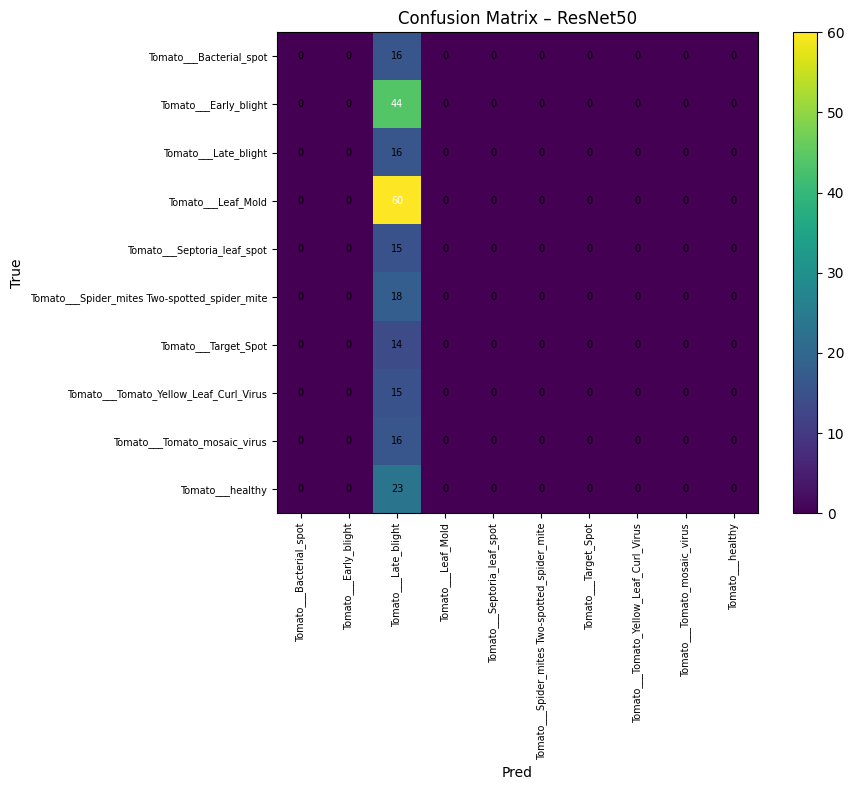

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Macro Precision: 0.0068, Recall: 0.1000, F1: 0.0126


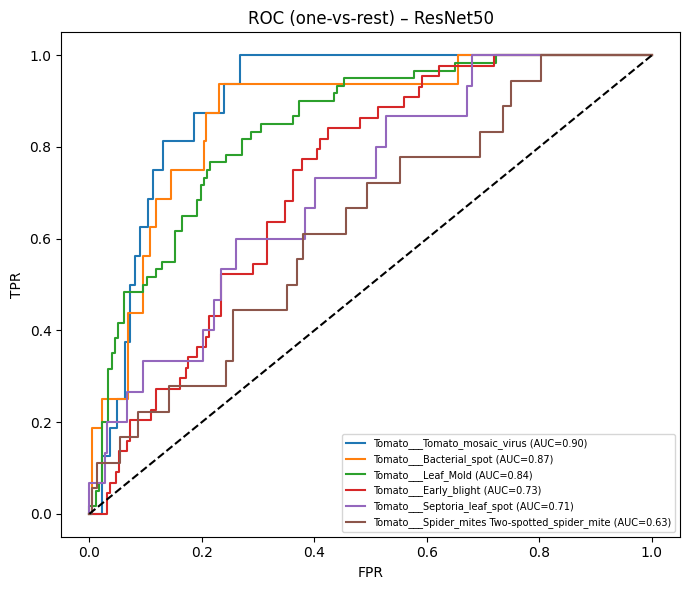


===== Evaluation: MobileNetV2 =====

Classification report:
                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot     0.5333    0.5000    0.5161        16
                        Tomato___Early_blight     0.5556    0.3409    0.4225        44
                         Tomato___Late_blight     0.6471    0.6875    0.6667        16
                           Tomato___Leaf_Mold     0.8214    0.3833    0.5227        60
                  Tomato___Septoria_leaf_spot     0.8000    0.5333    0.6400        15
Tomato___Spider_mites Two-spotted_spider_mite     0.8182    0.5000    0.6207        18
                         Tomato___Target_Spot     0.5263    0.7143    0.6061        14
       Tomato___Tomato_Yellow_Leaf_Curl_Virus     0.7368    0.9333    0.8235        15
                 Tomato___Tomato_mosaic_virus     0.9412    1.0000    0.9697        16
                             Tomato___healthy     0.2703    0.8696  

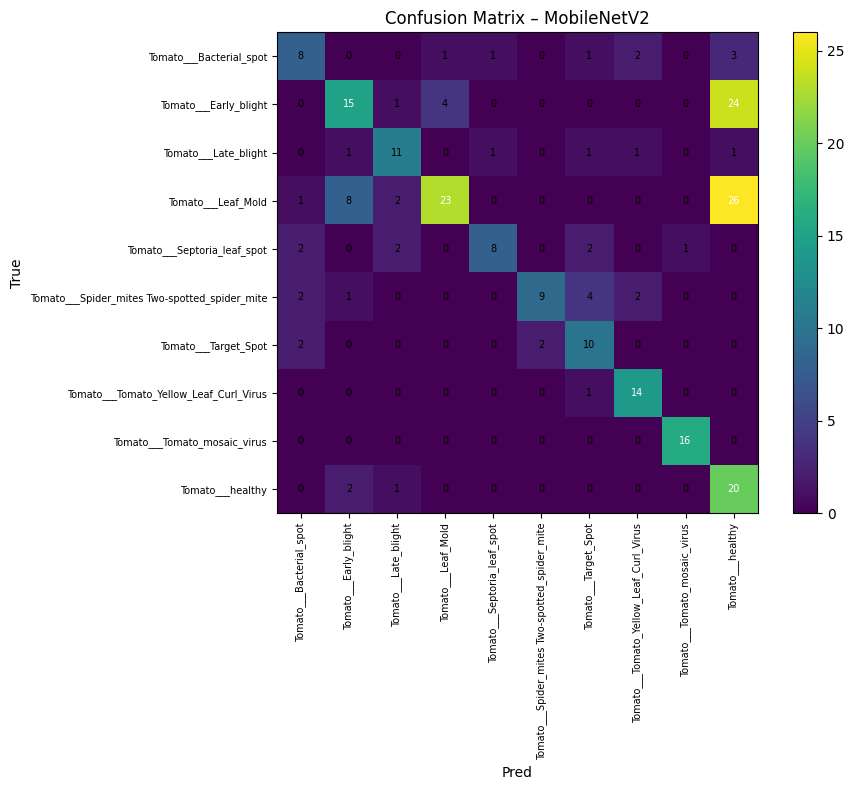

Macro Precision: 0.6650, Recall: 0.6462, F1: 0.6200


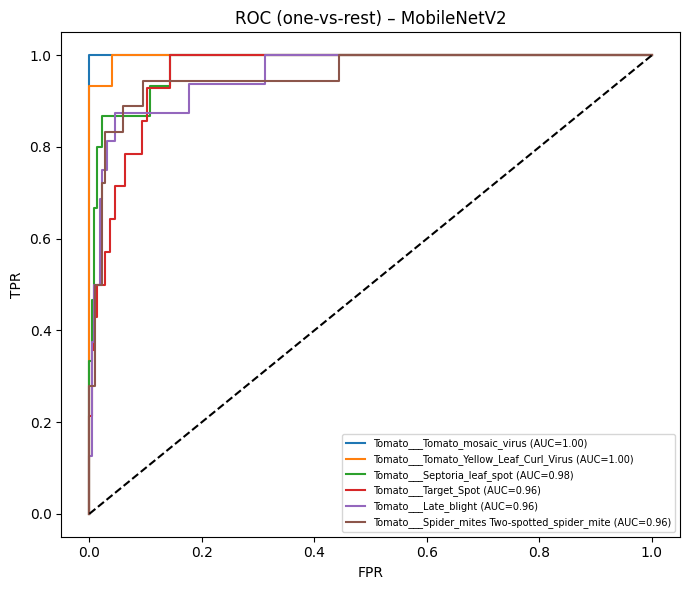


===== Evaluation: EfficientNetB0 =====



Classification report:
                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot     0.0000    0.0000    0.0000        16
                        Tomato___Early_blight     0.0000    0.0000    0.0000        44
                         Tomato___Late_blight     0.0000    0.0000    0.0000        16
                           Tomato___Leaf_Mold     0.0000    0.0000    0.0000        60
                  Tomato___Septoria_leaf_spot     0.0000    0.0000    0.0000        15
Tomato___Spider_mites Two-spotted_spider_mite     0.0000    0.0000    0.0000        18
                         Tomato___Target_Spot     0.0000    0.0000    0.0000        14
       Tomato___Tomato_Yellow_Leaf_Curl_Virus     0.0000    0.0000    0.0000        15
                 Tomato___Tomato_mosaic_virus     0.0675    1.0000    0.1265        16
                             Tomato___healthy     0.0000    0.0000    0.0000        23

                 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


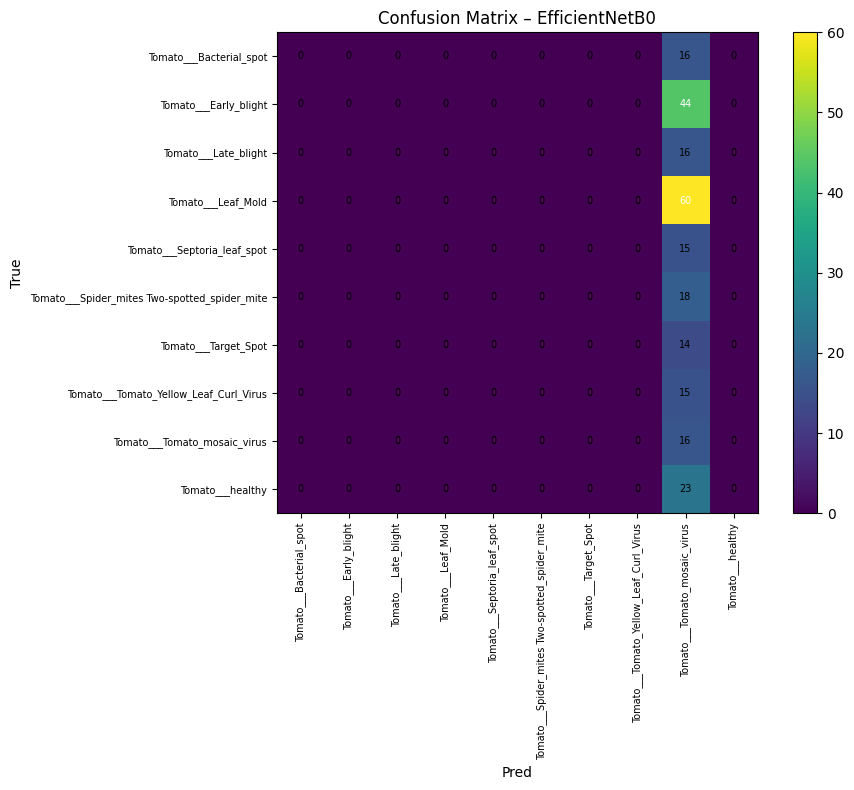

Macro Precision: 0.0068, Recall: 0.1000, F1: 0.0126


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


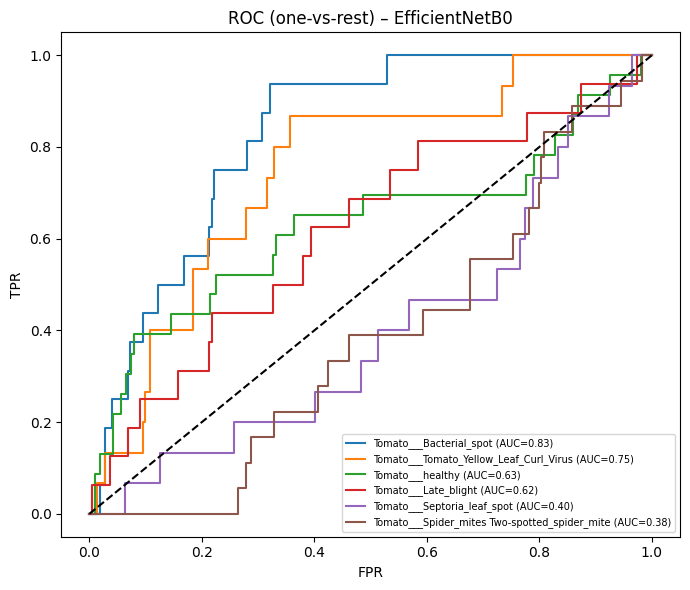

Validation accuracy snapshot: {'ResNet50': 0.7960199117660522, 'MobileNetV2': 0.7213930487632751, 'EfficientNetB0': 0.7960199117660522}
Selected BEST model: ResNet50


In [ ]:
def collect_preds(model, ds):
    y_true = []; y_prob = []
    for x,y in ds:
        y_true.append(y.numpy())
        y_prob.append(model.predict(x, verbose=0))
    y_true = np.concatenate(y_true, axis=0)
    y_prob = np.concatenate(y_prob, axis=0)
    y_pred = np.argmax(y_prob, axis=1)
    y_true_idx = np.argmax(y_true, axis=1)
    return y_true_idx, y_pred, y_prob

def evaluate_model(name, model):
    print(f"\n===== Evaluation: {name} =====")
    y_true_idx, y_pred_idx, y_prob = collect_preds(model, test_ds)

    print("\nClassification report:")
    print(classification_report(y_true_idx, y_pred_idx, target_names=class_dirs, digits=4))

    cm = confusion_matrix(y_true_idx, y_pred_idx)
    plt.figure(figsize=(10,8))
    plt.imshow(cm, interpolation='nearest')
    plt.title(f'Confusion Matrix – {name}'); plt.colorbar()
    tick = np.arange(len(class_dirs))
    plt.xticks(tick, class_dirs, rotation=90, fontsize=7); plt.yticks(tick, class_dirs, fontsize=7)
    thresh = cm.max()/2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black", fontsize=7)
    plt.ylabel('True'); plt.xlabel('Pred'); plt.tight_layout(); plt.show()

    p, r, f1, _ = precision_recall_fscore_support(y_true_idx, y_pred_idx, average='macro')
    print(f"Macro Precision: {p:.4f}, Recall: {r:.4f}, F1: {f1:.4f}")

    from sklearn.preprocessing import label_binarize
    y_true_onehot = label_binarize(y_true_idx, classes=list(range(len(class_dirs))))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_dirs)):
        fpr[i], tpr[i], _ = roc_curve(y_true_onehot[:, i], y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    top_idx = sorted(range(len(class_dirs)), key=lambda k: roc_auc[k], reverse=True)[:min(6, len(class_dirs))]
    plt.figure(figsize=(7,6))
    for i in top_idx:
        plt.plot(fpr[i], tpr[i], label=f"{class_dirs[i]} (AUC={roc_auc[i]:.2f})")
    plt.plot([0,1],[0,1],'k--'); plt.title(f"ROC (one-vs-rest) – {name}")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(fontsize=7); plt.tight_layout(); plt.show()

for name, model in best_models.items():
    evaluate_model(name, model)

val_acc = {name: history_dict[name]['val_accuracy'][-(np.argmax(history_dict[name]['val_accuracy'][::-1])+1)] for name in history_dict}
best_name = max(val_acc, key=val_acc.get); best_model = best_models[best_name]
print("Validation accuracy snapshot:", val_acc)
print("Selected BEST model:", best_name)


## 11) Verification: Predict on sample images


Image: /content/processed_tomato_224/test/Tomato___Early_blight/1723454502013.jpg
Predicted: Tomato___Early_blight (conf=99.85%)
  - Tomato___Early_blight: 99.85%
  - Tomato___Leaf_Mold: 0.10%
  - Tomato___healthy: 0.02%


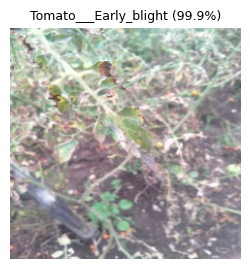


Image: /content/processed_tomato_224/test/Tomato___Spider_mites Two-spotted_spider_mite/0e9318de-e920-4d2c-bb61-5ef0a628d273___Com.G_SpM_FL 9302.JPG
Predicted: Tomato___Spider_mites Two-spotted_spider_mite (conf=61.17%)
  - Tomato___Spider_mites Two-spotted_spider_mite: 61.17%
  - Tomato___Target_Spot: 37.63%
  - Tomato___Late_blight: 0.67%


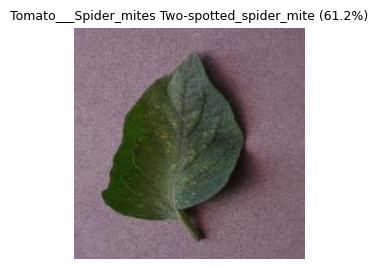


Image: /content/processed_tomato_224/test/Tomato___healthy/IMG-20240812-WA0119.jpg
Predicted: Tomato___Leaf_Mold (conf=53.39%)
  - Tomato___Leaf_Mold: 53.39%
  - Tomato___Early_blight: 31.97%
  - Tomato___healthy: 14.56%


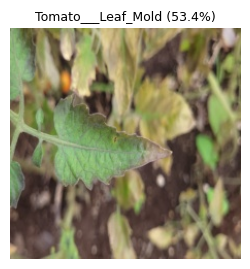


Image: /content/processed_tomato_224/test/Tomato___Spider_mites Two-spotted_spider_mite/1f3c081d-ddf4-48f7-884b-08b3a5b3ae0a___Com.G_SpM_FL 1307.JPG
Predicted: Tomato___Spider_mites Two-spotted_spider_mite (conf=99.94%)
  - Tomato___Spider_mites Two-spotted_spider_mite: 99.94%
  - Tomato___Target_Spot: 0.06%
  - Tomato___Tomato_mosaic_virus: 0.01%


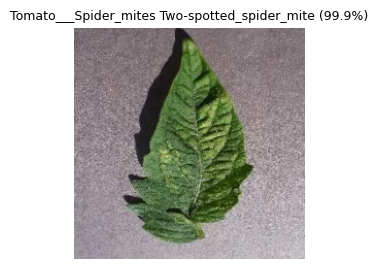


Image: /content/processed_tomato_224/test/Tomato___Tomato_Yellow_Leaf_Curl_Virus/1c0478dc-09a0-4828-ab05-60c7063c7491___UF.GRC_YLCV_Lab 03153.JPG
Predicted: Tomato___Tomato_Yellow_Leaf_Curl_Virus (conf=99.98%)
  - Tomato___Tomato_Yellow_Leaf_Curl_Virus: 99.98%
  - Tomato___Late_blight: 0.02%
  - Tomato___Leaf_Mold: 0.00%


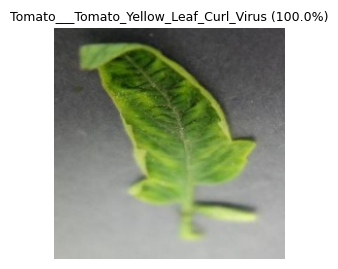


Image: /content/processed_tomato_224/test/Tomato___Bacterial_spot/0da838ea-fd8c-43c0-a437-4aba96234262___UF.GRC_BS_Lab Leaf 8770.JPG
Predicted: Tomato___Tomato_Yellow_Leaf_Curl_Virus (conf=49.50%)
  - Tomato___Tomato_Yellow_Leaf_Curl_Virus: 49.50%
  - Tomato___Bacterial_spot: 37.08%
  - Tomato___Spider_mites Two-spotted_spider_mite: 7.85%


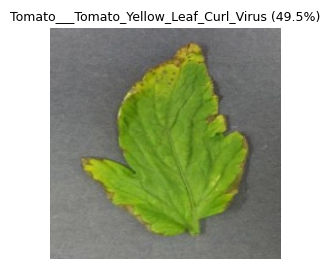

In [ ]:
# ===== Verification Helpers =====
import random
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

# Optional: different random each run. Comment these out if you want reproducibility.
# random.seed(None)
# np.random.seed(None)

def _get_preprocess_for_model(model):
    """Return (preprocess_fn, tag) matched to the backbone name in the model."""
    name = (getattr(model, "name", "") or "").lower()
    try:
        if "resnet50" in name:
            from tensorflow.keras.applications.resnet50 import preprocess_input as pp
            return pp, "resnet50"
        if "mobilenetv2" in name:
            from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as pp
            return pp, "mobilenetv2"
        if "efficientnet" in name:  # EfficientNetB0/… share module
            from tensorflow.keras.applications.efficientnet import preprocess_input as pp
            return pp, "efficientnet"
    except Exception:
        pass
    # Fallback: simple 0–1 scaling
    return (lambda x: x / 255.0), "simple"

def load_and_prep(path, size=(224, 224), preprocess_fn=lambda x: x/255.0):
    """Load an image, resize, and apply the given preprocess function (expects 0..255 input)."""
    im = Image.open(path).convert("RGB").resize(size, Image.BILINEAR)
    arr = np.array(im).astype(np.float32)  # keep 0..255 for backbone preprocess_input
    arr = preprocess_fn(arr)
    return arr

def pick_random_test_images(root, k=6):
    """Pick k random images from PROCESSED_DIR/test/**/. """
    test_root = Path(root) / "test"
    all_imgs = []
    for cls in class_dirs:
        all_imgs.extend([str(p) for p in (test_root / cls).glob("*.*")])
    if not all_imgs:
        raise RuntimeError(f"No images found under {test_root}. Did you run preprocessing/splitting?")
    k = min(k, len(all_imgs))
    return random.sample(all_imgs, k)

def pick_random_test_images_per_class(root, per_class=2):
    """Pick up to N random images PER CLASS from PROCESSED_DIR/test/**."""
    picks = []
    test_root = Path(root) / "test"
    for cls in class_dirs:
        imgs = [str(p) for p in (test_root / cls).glob("*.*")]
        if imgs:
            random.shuffle(imgs)
            picks.extend(imgs[:per_class])
    random.shuffle(picks)
    return picks

def predict_images(image_paths, model=None, topk=3):
    """Predict and show results for the provided list of image paths."""
    if model is None:
        model = best_model  # use the selected/best model from your notebook
    preprocess_fn, tag = _get_preprocess_for_model(model)

    # Prepare batch
    imgs_proc = [load_and_prep(p, size=(IMG_W, IMG_H), preprocess_fn=preprocess_fn) for p in image_paths]
    x = np.stack(imgs_proc, axis=0)
    probs = model.predict(x, verbose=0)
    preds = probs.argmax(axis=1)

    # Display
    for i, pth in enumerate(image_paths):
        pred_cls = class_dirs[preds[i]]
        conf = probs[i][preds[i]] * 100.0
        print(f"\nImage: {pth}")
        print(f"Predicted: {pred_cls} (conf={conf:.2f}%)")
        top_idx = probs[i].argsort()[::-1][:topk]
        for j in top_idx:
            print(f"  - {class_dirs[j]}: {probs[i][j]*100:.2f}%")

        # Show the *original* resized image (not preprocessed) for clarity
        disp_img = np.array(Image.open(pth).convert("RGB").resize((IMG_W, IMG_H)))
        plt.figure(figsize=(3, 3))
        plt.imshow(disp_img)
        plt.title(f"{pred_cls} ({conf:.1f}%)", fontsize=9)
        plt.axis("off")
        plt.show()

# === Verification A: Random across ALL classes ===
k = 6  # how many images total to sample (will cap at available)
sample_test_images = pick_random_test_images(PROCESSED_DIR, k=k)
predict_images(sample_test_images, model=best_model, topk=3)
